In [0]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sys
import folium
from sklearn.cluster import DBSCAN 

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
data1 = np.genfromtxt('/content/drive/My Drive/Data Mining/HW2/data/covid.csv', delimiter=',')
data2 = np.genfromtxt('/content/drive/My Drive/Data Mining/HW2/data/covid-sample.csv', delimiter=',')

In [0]:
color_dict = {-1:"black", 0:"blue", 1:"red", 2:"cyan", 3:"yellow", 4:"orange", 5:"purple", 6:"gray", 7:"darkred", 8:"pink", 9:"lightgray", 10:"lightblue", 11:"white", 12:"green", 13:"lightgreen", 14:"darkpurple"}

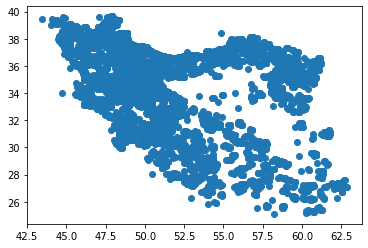

In [0]:
plt.scatter(data1[:,1], data1[:,0])
plt.show()

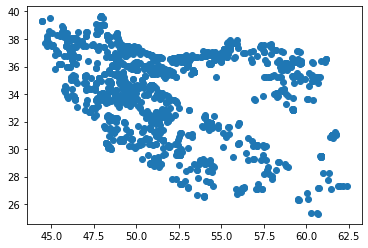

In [0]:
plt.scatter(data2[:,1], data2[:,0])
plt.show()

In [0]:
map1 = folium.Map(location=[32.427910, 53.688046], zoom_start=5)

In [0]:
map1

In [0]:
map2 = folium.Map(location=[32.427910, 53.688046], zoom_start=5)


for point in data1:
    
    folium.Circle(location=point, radius = 1, color='red', fill=True).add_to(map2)

In [0]:
map2

In [0]:
def dbscan_on_covid_data(data, minpts, eps):
    
    covid_db = DBSCAN(eps=eps, min_samples=minpts)
    predict = covid_db.fit_predict(data)
    label_numbers_list = []
    for i in range(-1, 30):
        label_numbers_list.append(np.count_nonzero(predict==i))     
    print("count of each label starting with -1(noise): ",label_numbers_list)
    my_map = folium.Map(location=[32.427910, 53.688046], zoom_start=5)

    for i in range(data.shape[0]):
        if predict[i] == -1:
            folium.Circle(location=data[i], radius = 10, color=color_dict[predict[i]], fill=True).add_to(my_map)
    for i in range(data.shape[0]):
        if predict[i] != -1:
            folium.Circle(location=data[i], radius = 0.5, color=color_dict[predict[i]], fill=False).add_to(my_map)
    
    return my_map

In [0]:
map3 = dbscan_on_covid_data(data1, minpts=200, eps=0.5)

count of each label starting with -1(noise):  [5097, 653, 220, 9149, 164, 446, 939, 420, 378, 727, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [0]:
map3